## Vulnerability in the US at Census Tract Level

In [2]:
import geopandas as gpd
import pandas as pd
import pathlib

import matplotlib.pyplot as plt

from cartopy import crs as ccrs

import os
import sys
import subprocess
import datetime
import platform
import datetime

In [3]:
# The projection will be used to plot the maps
albo = ccrs.AlbersEqualArea(
    central_longitude=-96,
    central_latitude=37.5,
    false_easting=0.0,
    false_northing=0.0,
    standard_parallels=(29.5, 45.5),
    globe=None,
)

In [4]:
import glob
path=r'census_shp'

file=glob.glob(os.path.join(path, 'cb_2018_**_tract_500k.shp'))
# print(file)
print(len(file))

56


In [5]:
## Import the census tracts

basemap= gpd.GeoDataFrame()
for f in file:
    basemap = pd.concat([basemap, gpd.read_file(f)], axis=0)
    
basemap = basemap[['GEOID','AFFGEOID','STATEFP','geometry']]
basemap.head()

,GEOID,AFFGEOID,STATEFP,geometry
0,01117030317,1400000US01117030317,01,"POLYGON ((-86.85267 33.28148, -86.84919 33.285..."
1,01119011500,1400000US01119011500,01,"POLYGON ((-88.40379 32.44977, -88.40379 32.449..."
2,01121010900,1400000US01121010900,01,"POLYGON ((-86.11897 33.42176, -86.11435 33.428..."
3,01125010102,1400000US01125010102,01,"POLYGON ((-87.60330 33.35924, -87.60228 33.360..."
4,01089000701,1400000US01089000701,01,"POLYGON ((-86.61669 34.77128, -86.60575 34.771..."


In [6]:
basemap.crs

<Geographic 2D CRS: EPSG:4269>
Name: NAD83
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: North America - onshore and offshore: Canada - Alberta; British Columbia; Manitoba; New Brunswick; Newfoundland and Labrador; Northwest Territories; Nova Scotia; Nunavut; Ontario; Prince Edward Island; Quebec; Saskatchewan; Yukon. Puerto Rico. United States (USA) - Alabama; Alaska; Arizona; Arkansas; California; Colorado; Connecticut; Delaware; Florida; Georgia; Hawaii; Idaho; Illinois; Indiana; Iowa; Kansas; Kentucky; Louisiana; Maine; Maryland; Massachusetts; Michigan; Minnesota; Mississippi; Missouri; Montana; Nebraska; Nevada; New Hampshire; New Jersey; New Mexico; New York; North Carolina; North Dakota; Ohio; Oklahoma; Oregon; Pennsylvania; Rhode Island; South Carolina; South Dakota; Tennessee; Texas; Utah; Vermont; Virginia; Washington; West Virginia; Wisconsin; Wyoming. US Virgin Islands. British Virgin Islands

In [7]:
## Change the projection
basemap = basemap.to_crs(albo.proj4_init)

In [8]:
## Change the position of Alaska and the islands

m = basemap.STATEFP =='15'
basemap[m] = basemap[m].set_geometry(basemap[m].translate(5000000,-1500000))

n = basemap.STATEFP == '02'
basemap[n] = basemap[n].set_geometry(basemap[n].scale(.5,.5,.5,origin=(-3000000, 4000000)).translate(1000000, -4800000))

<AxesSubplot:>

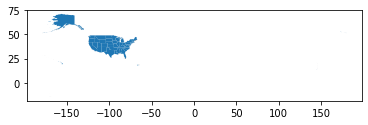

In [9]:
# State Boundary will be used in Maps
## Import the state boundaries
state_boundary = gpd.read_file('state_shp/cb_2018_us_state_500k.shp')
state_boundary.plot()

In [10]:
state_boundary = state_boundary.to_crs(albo.proj4_init)

m = state_boundary.STATEFP =='15'
state_boundary[m] = state_boundary[m].set_geometry(state_boundary[m].translate(5000000,-1500000))

n = state_boundary.STATEFP == '02'
state_boundary[n] = state_boundary[n].set_geometry(state_boundary[n].scale(.5,.5,.5,origin=(-3000000, 4000000)).translate(1000000, -4800000))

# Exposure Dimension

In [11]:
## Import data

exposure = pd.read_csv('census_data/exposure_census.csv', dtype = {'State':str,"GEOID":str,"GEO_ID":str})
exposure.head()

,Unnamed: 0.2,Unnamed: 0,Unnamed: 0.1,State,Price,AFFGEOID,GEOID,fuel,GEO_ID,NAME,HH_num_total,median_income,exposure,min_max_ex
0,0,0,0,9,2.229,1400000US09001022000,09001022000,1057.581145,09001022000,"Census Tract 220, Fairfield County, Connecticut",1020,82753.0,0.028487,0.055157
1,1,1,1,9,2.229,1400000US09001042500,09001042500,1175.059270,09001042500,"Census Tract 425, Fairfield County, Connecticut",1465,129821.0,0.020176,0.035431
2,2,2,2,9,2.229,1400000US09001043500,09001043500,1108.900146,09001043500,"Census Tract 435, Fairfield County, Connecticut",933,104417.0,0.023672,0.043729
3,3,3,3,9,2.229,1400000US09001010700,09001010700,591.341144,09001010700,"Census Tract 107, Fairfield County, Connecticut",1682,61667.0,0.021374,0.038277
4,4,4,4,9,2.229,1400000US09001021500,09001021500,561.379578,09001021500,"Census Tract 215, Fairfield County, Connecticut",2094,43357.0,0.028861,0.056045


In [12]:
exposure_map = pd.merge(exposure,basemap,on='GEOID',how='right')
exposure_map = gpd.GeoDataFrame(exposure_map,crs = albo.proj4_init)
exposure_map.crs

<Derived Projected CRS: +proj=aea +ellps=WGS84 +lon_0=-96 +lat_0=37.5 +x_0 ...>
Name: unknown
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- undefined
Coordinate Operation:
- name: unknown
- method: Albers Equal Area
Datum: Unknown based on WGS84 ellipsoid
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [13]:
exposure_map.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 73874 entries, 0 to 73873
Data columns (total 17 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   Unnamed: 0.2   73745 non-null  float64 
 1   Unnamed: 0     73745 non-null  float64 
 2   Unnamed: 0.1   73745 non-null  float64 
 3   State          73745 non-null  object  
 4   Price          72837 non-null  float64 
 5   AFFGEOID_x     73745 non-null  object  
 6   GEOID          73874 non-null  object  
 7   fuel           73745 non-null  float64 
 8   GEO_ID         73745 non-null  object  
 9   NAME           73745 non-null  object  
 10  HH_num_total   73745 non-null  float64 
 11  median_income  72788 non-null  float64 
 12  exposure       71916 non-null  float64 
 13  min_max_ex     71916 non-null  float64 
 14  AFFGEOID_y     73874 non-null  object  
 15  STATEFP        73874 non-null  object  
 16  geometry       73874 non-null  geometry
dtypes: float64(9), geometry

ModuleNotFoundError: No module named 'palettable'

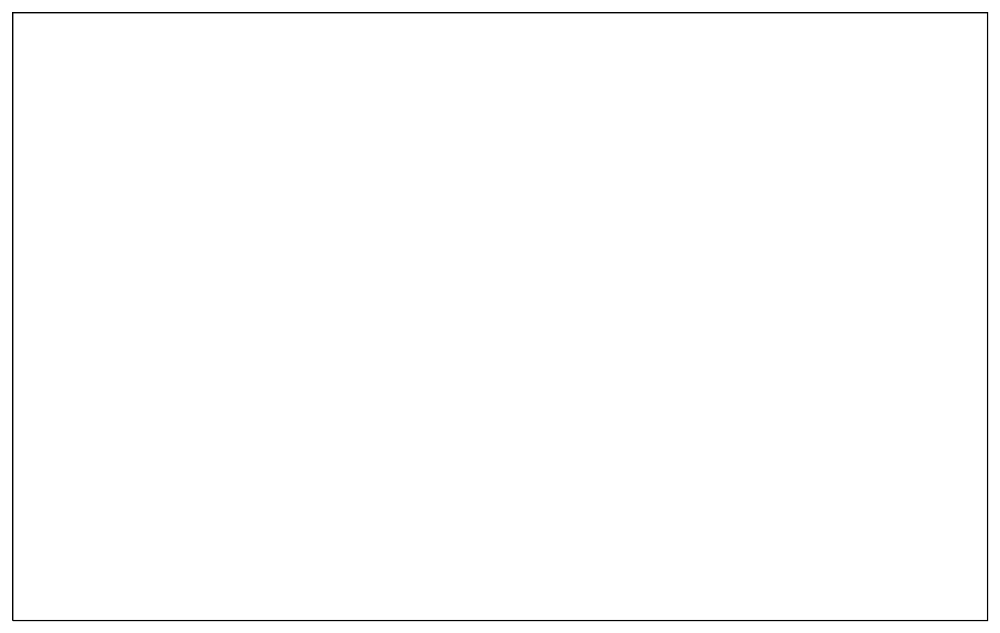

In [14]:
import numpy as np

fig, ax = plt.subplots(
    subplot_kw={'projection': albo}, figsize=(10, 10),dpi=300
)
font = {'family': 'serif',
        'serif': 'Times New Roman',
        'weight': 'normal',
        'size': 12}
plt.rc('font', **font)
# plt.rc('font',family='Times New Roman')

ax.set_extent([-129, -73, 20, 50], crs=ccrs.PlateCarree())

from palettable.matplotlib import Viridis_7

cmap = Viridis_7.mpl_colormap

exposure_map.plot(
    column='min_max_ex',
    ax=ax,
    cmap=cmap,
    legend=True,
    scheme='NaturalBreaks',
    legend_kwds={'loc': 'upper left',
                 'title': 'Exposure',
                 "fmt": "{:.3f}",
                 'title_fontsize': 14, # Title of legend
                 'fontsize': 11, # Font of legend
                 'shadow': True
                },               
    missing_kwds={
                "color": "lightgrey",
                "edgecolor": "grey",
                "hatch": "////",
                "label": "Nan"
                },
#     prop={'family': 'Times New Roman', 'size': 16},
    edgecolor=np.array([0., 0., 0., 0.]), #'white',
    linewidth=0.2
)
state_boundary.boundary.plot(ax=ax,edgecolor='white',linewidth=0.5)

ax.axis('on')
ax.set_title('Transportation Energy Vulnerability in the US - Exposure', fontdict={'family':'Times New Roman','weight':'bold','size': 20},pad=20)
plt.tight_layout(pad=4.5)


ax.set_aspect('equal','box')
# fig.tight_layout()

fig.savefig('Figures/Exposure_USA.png', facecolor='w', dpi=500)

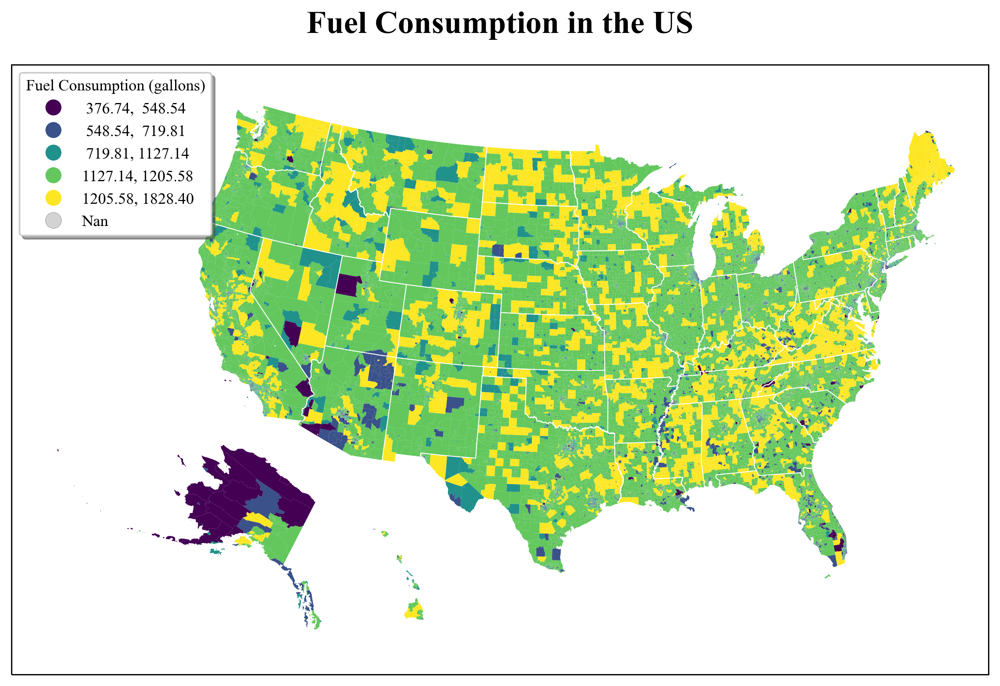

In [17]:
import numpy as np

fig, ax = plt.subplots(
    subplot_kw={'projection': albo}, figsize=(10, 10),dpi=300
)
font = {'family': 'serif',
        'serif': 'Times New Roman',
        'weight': 'normal',
        'size': 12}
plt.rc('font', **font)
ax.set_extent([-129, -73, 20, 50], crs=ccrs.PlateCarree())

from palettable.matplotlib import Viridis_7

cmap = Viridis_7.mpl_colormap

exposure_map.plot(
    column='fuel',
    ax=ax,
    cmap=cmap,
    legend=True,
    scheme='NaturalBreaks',
    legend_kwds={'loc': 'upper left',
                 'title': 'Fuel Consumption (gallons)',
                 "fmt": "{:.2f}",
                 'title_fontsize': 10, 
                 'fontsize': 10, 
                 'shadow': True
                },               
    missing_kwds={
                "color": "lightgrey",
                "edgecolor": "grey",
                "hatch": "////",
                "label": "Nan"
                },
#     prop={'family': 'Times New Roman', 'size': 16},
    edgecolor=np.array([0., 0., 0., 0.]), #'white',
    linewidth=0.2
)
state_boundary.boundary.plot(ax=ax,edgecolor='white',linewidth=0.5)

ax.axis('on')
ax.set_title('Fuel Consumption in the US', fontdict={'weight':'bold','size': 20}, pad=20)
plt.tight_layout(pad=4.5)


ax.set_aspect('equal','box')
# fig.tight_layout()

fig.savefig('Figures/Fuel Consumption_USA.png', facecolor='w', dpi=500)

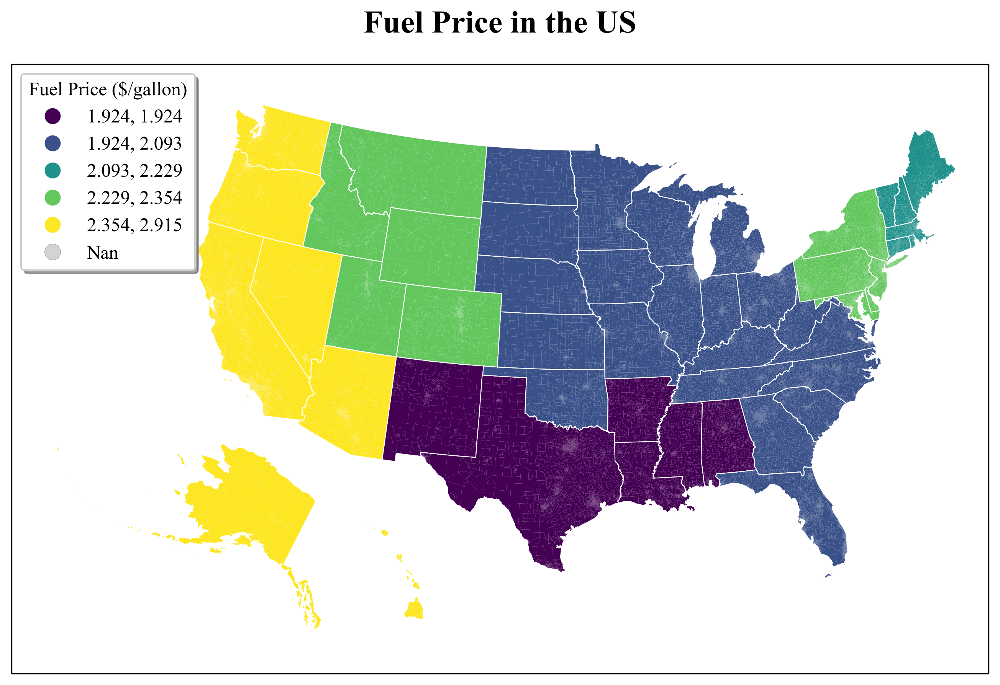

In [18]:
import numpy as np

fig, ax = plt.subplots(
    subplot_kw={'projection': albo}, figsize=(10, 10),dpi=300
)
font = {'family': 'serif',
        'serif': 'Times New Roman',
        'weight': 'normal',
        'size': 12}
plt.rc('font', **font)
ax.set_extent([-129, -73, 20, 50], crs=ccrs.PlateCarree())

from palettable.matplotlib import Viridis_7

cmap = Viridis_7.mpl_colormap

exposure_map.plot(
    column='Price',
    ax=ax,
    cmap=cmap,
    legend=True,
    scheme='NaturalBreaks',
    legend_kwds={'loc': 'upper left',
                 'title': 'Fuel Price ($/gallon)',
                 "fmt": "{:.3f}",
                 'title_fontsize': 12, 
                 'fontsize': 12, 
                 'shadow': True
                },               
    missing_kwds={
                "color": "lightgrey",
                "edgecolor": "grey",
                "hatch": "////",
                "label": "Nan"
                },
#     prop={'family': 'Times New Roman', 'size': 16},
    edgecolor=np.array([0., 0., 0., 0.]), #'white',
    linewidth=0.2
)
state_boundary.boundary.plot(ax=ax,edgecolor='white',linewidth=0.5)

ax.axis('on')
ax.set_title('Fuel Price in the US', fontdict={'weight':'bold','size': 20}, pad=20)
plt.tight_layout(pad=4.5)


ax.set_aspect('equal','box')
# fig.tight_layout()

fig.savefig('Figures/Price_USA.png', facecolor='w', dpi=500)

# Sensitivity Dimension

In [19]:
sensitivity = pd.read_csv("census_data/sensitivity_census.csv", dtype={"Geocode": str})

In [20]:
sensitivity.head()

,Unnamed: 0.1,Unnamed: 0,Geocode,X1,X2,X3,X4,X5,X6,X7,Sensitivity,z_score_sens,min_max_sens
0,0,0,01001020100,0.166583,0.4378,0.113397,0.009533,0.717010,0.132464,0.188660,0.252207,-0.345779,0.470402
1,1,1,01001020200,0.166922,0.3305,0.582440,0.004594,0.639612,0.144972,0.196018,0.295008,0.444644,0.550234
2,2,2,01001020300,0.172512,0.2927,0.260051,0.066439,0.706872,0.160251,0.201882,0.265815,-0.094468,0.495784
3,3,3,01001020400,0.046416,0.3711,0.070397,0.000000,0.751160,0.244714,0.167870,0.235951,-0.645974,0.440083
4,4,4,01001020500,0.149207,0.3735,0.192337,0.030294,0.837958,0.138071,0.198282,0.274236,0.061032,0.511489


In [21]:
sensitivity_map = pd.merge(sensitivity,basemap,left_on='Geocode',right_on='GEOID',how='right').drop(['Geocode'],axis=1)

In [22]:
sensitivity_map = gpd.GeoDataFrame(sensitivity_map,crs = albo.proj4_init)

In [23]:
sensitivity_map.crs

<Derived Projected CRS: +proj=aea +ellps=WGS84 +lon_0=-96 +lat_0=37.5 +x_0 ...>
Name: unknown
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- undefined
Coordinate Operation:
- name: unknown
- method: Albers Equal Area
Datum: Unknown based on WGS84 ellipsoid
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

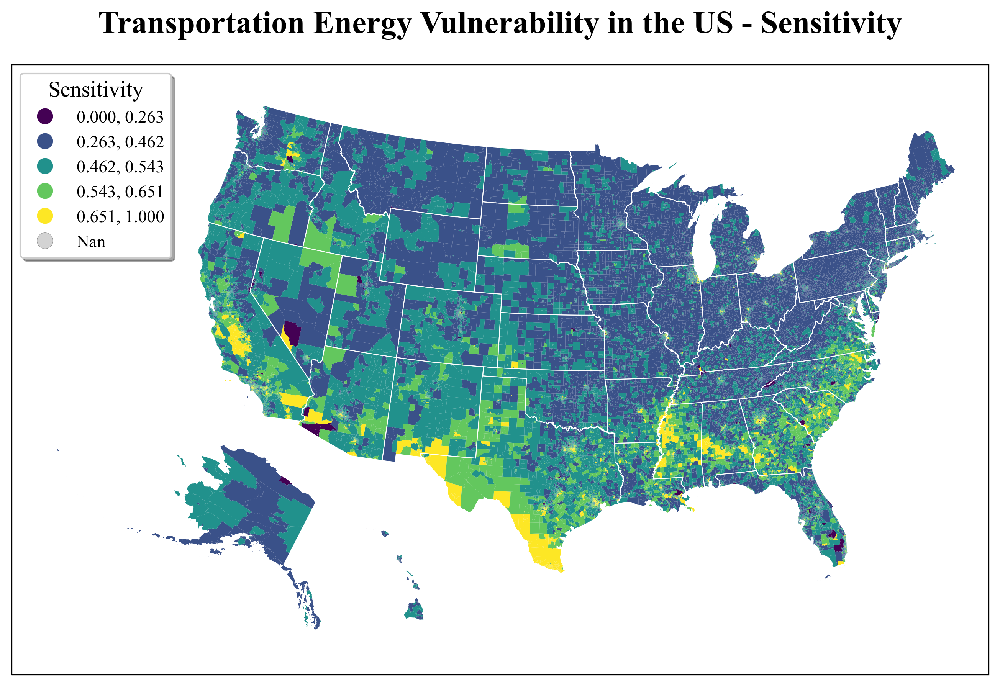

In [24]:
import numpy as np

fig, ax = plt.subplots(
    subplot_kw={'projection': albo}, figsize=(10, 10),dpi=300
)
font = {'family': 'serif',
        'serif': 'Times New Roman',
        'weight': 'normal',
        'size': 12}
plt.rc('font', **font)
ax.set_extent([-129, -73, 20, 50], crs=ccrs.PlateCarree())

from palettable.matplotlib import Viridis_7

cmap = Viridis_7.mpl_colormap

sensitivity_map.plot(
    column='min_max_sens',
    ax=ax,
    cmap=cmap,
    legend=True,
    scheme='NaturalBreaks',
    legend_kwds={'loc': 'upper left',
                 'title': 'Sensitivity',
                 "fmt": "{:.3f}",
                 'title_fontsize': 14, 
                 'fontsize': 11, 
                 'shadow': True
                },               
    missing_kwds={
                "color": "lightgrey",
                "edgecolor": "grey",
                "hatch": "////",
                "label": "Nan"
                },
#     prop={'family': 'Times New Roman', 'size': 16},
    edgecolor=np.array([0., 0., 0., 0.]), #'white',
    linewidth=0.2
)
state_boundary.boundary.plot(ax=ax,edgecolor='white',linewidth=0.5)

ax.axis('on')
ax.set_title('Transportation Energy Vulnerability in the US - Sensitivity', fontdict={'weight':'bold','size': 20},pad=20)
plt.tight_layout(pad=4.5)


ax.set_aspect('equal','box')
# fig.tight_layout()

fig.savefig('Figures/Sensitivity_USA.png', facecolor='w', dpi=500)

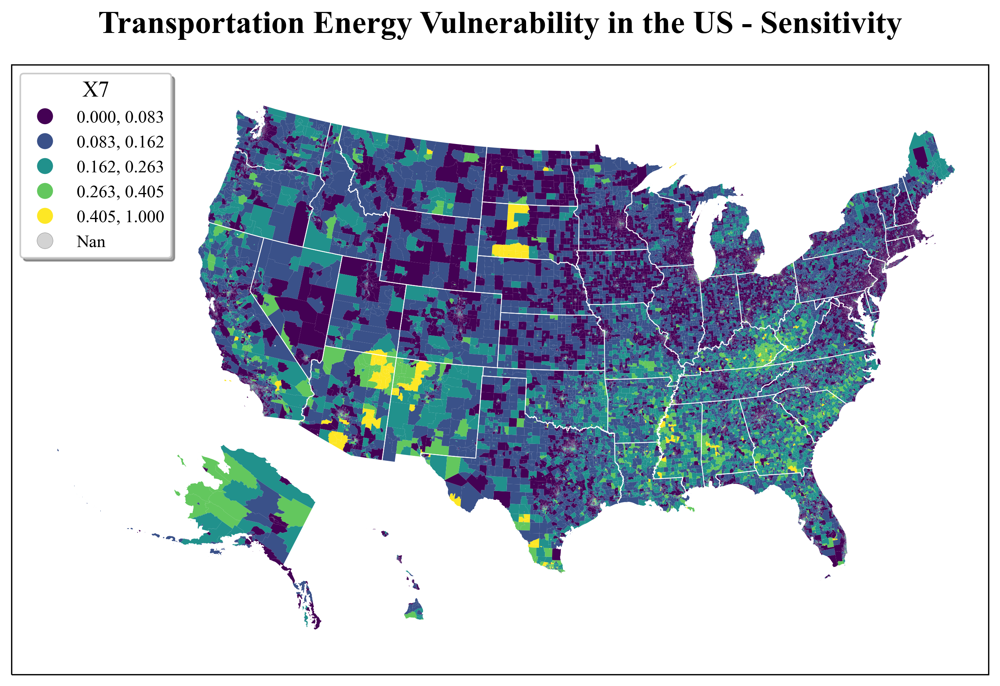

In [25]:
import numpy as np

fig, ax = plt.subplots(
    subplot_kw={'projection': albo}, figsize=(10, 10),dpi=300
)
font = {'family': 'serif',
        'serif': 'Times New Roman',
        'weight': 'normal',
        'size': 12}
plt.rc('font', **font)
ax.set_extent([-129, -73, 20, 50], crs=ccrs.PlateCarree())

from palettable.matplotlib import Viridis_7

cmap = Viridis_7.mpl_colormap

sensitivity_map.plot(
    column='X1',     # change it from X1 to X7 if need to check individual component
    ax=ax,
    cmap=cmap,
    legend=True,
    scheme='NaturalBreaks',
    legend_kwds={'loc': 'upper left',
                 'title': 'X7',
                 "fmt": "{:.3f}",
                 'title_fontsize': 14, 
                 'fontsize': 11, 
                 'shadow': True
                },               
    missing_kwds={
                "color": "lightgrey",
                "edgecolor": "grey",
                "hatch": "////",
                "label": "Nan"
                },
#     prop={'family': 'Times New Roman', 'size': 16},
    edgecolor=np.array([0., 0., 0., 0.]), #'white',
    linewidth=0.2
)
state_boundary.boundary.plot(ax=ax,edgecolor='white',linewidth=0.5)

ax.axis('on')
ax.set_title('Transportation Energy Vulnerability in the US - Sensitivity', fontdict={'weight':'bold','size': 20},pad=20)
plt.tight_layout(pad=4.5)


ax.set_aspect('equal','box')
# fig.tight_layout()

fig.savefig('Figures/X1.png', facecolor='w', dpi=500)   # change it from X1 to X7 if need to check individual component

# Adaptive Capacity Dimension

In [26]:
adaptive_capacity = pd.read_csv('census_data/adaptive_capacity_census.csv',dtype={"GEO_ID":str})
adaptive_capacity.head()

,Unnamed: 0.1,Unnamed: 0,GEO_ID,Weighted_D5be,Weighted_D4c,Weighted_D4a,D5be_score,D4c_score,D4a_score,ac,min_max_ac
0,0,0,01001020100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,1,01001020200,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,2,01001020300,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,3,01001020400,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,4,01001020500,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [27]:
adaptive_capacity_map = pd.merge(adaptive_capacity,basemap,left_on='GEO_ID',right_on='GEOID',how='right').drop(['GEO_ID'],axis=1)
adaptive_capacity_map.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 73874 entries, 0 to 73873
Data columns (total 14 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   Unnamed: 0.1   73818 non-null  float64 
 1   Unnamed: 0     73818 non-null  float64 
 2   Weighted_D5be  25520 non-null  float64 
 3   Weighted_D4c   28062 non-null  float64 
 4   Weighted_D4a   26564 non-null  float64 
 5   D5be_score     25520 non-null  float64 
 6   D4c_score      28062 non-null  float64 
 7   D4a_score      26564 non-null  float64 
 8   ac             25231 non-null  float64 
 9   min_max_ac     25230 non-null  float64 
 10  GEOID          73874 non-null  object  
 11  AFFGEOID       73874 non-null  object  
 12  STATEFP        73874 non-null  object  
 13  geometry       73874 non-null  geometry
dtypes: float64(10), geometry(1), object(3)
memory usage: 8.5+ MB


In [28]:
adaptive_capacity_map = gpd.GeoDataFrame(adaptive_capacity_map,crs = albo.proj4_init)
adaptive_capacity_map.crs

<Derived Projected CRS: +proj=aea +ellps=WGS84 +lon_0=-96 +lat_0=37.5 +x_0 ...>
Name: unknown
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- undefined
Coordinate Operation:
- name: unknown
- method: Albers Equal Area
Datum: Unknown based on WGS84 ellipsoid
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

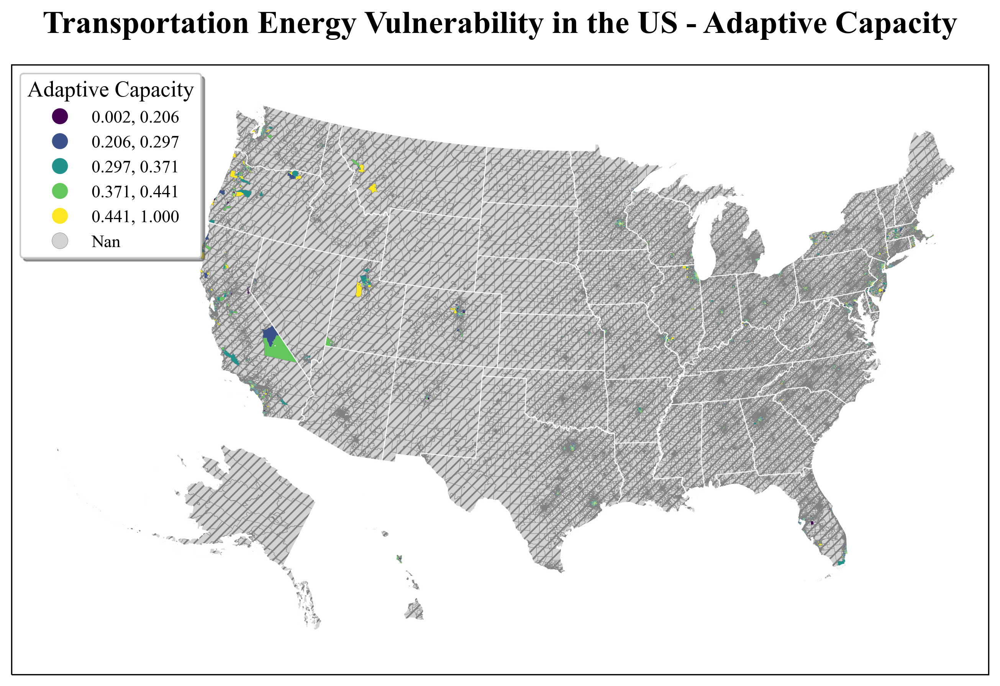

In [29]:
import numpy as np

fig, ax = plt.subplots(
    subplot_kw={'projection': albo}, figsize=(10, 10),dpi=300
)
font = {'family': 'serif',
        'serif': 'Times New Roman',
        'weight': 'normal',
        'size': 12}
plt.rc('font', **font)
ax.set_extent([-129, -73, 20, 50], crs=ccrs.PlateCarree())

from palettable.matplotlib import Viridis_7

cmap = Viridis_7.mpl_colormap

adaptive_capacity_map.plot(
    column='min_max_ac',
    ax=ax,
    cmap=cmap,
    legend=True,
    scheme='NaturalBreaks',
    legend_kwds={'loc': 'upper left',
                 'title': 'Adaptive Capacity',
                 "fmt": "{:.3f}",
                 'title_fontsize': 14, 
                 'fontsize': 11, 
                 'shadow': True
                },               
    missing_kwds={
                "color": "lightgrey",
                "edgecolor": "grey",
                "hatch": "////",
                "label": "Nan"
                },
    edgecolor=np.array([0., 0., 0., 0.]), #'white',
    linewidth=0.2
)
state_boundary.boundary.plot(ax=ax,edgecolor='white',linewidth=0.5)

ax.axis('on')
ax.set_title('Transportation Energy Vulnerability in the US - Adaptive Capacity',fontdict={'weight':'bold','size': 20},pad=20)
plt.tight_layout(pad=4.5)


ax.set_aspect('equal','box')
# fig.tight_layout()

fig.savefig('Figures/Adaptive Capacity_USA.png', facecolor='w', dpi=500)

# Vulnerabilty Score

In [30]:
e = exposure_map[['GEOID','min_max_ex']]
s = sensitivity_map[['GEOID','min_max_sens']]
ac = adaptive_capacity_map[['GEOID','min_max_ac']]

In [31]:
vulnerablity = pd.merge(e, s, on="GEOID")
vulnerablity = pd.merge(vulnerablity, ac, on="GEOID")
vulnerablity.head()

,GEOID,min_max_ex,min_max_sens,min_max_ac
0,01117030317,0.057365,0.483589,NaN
1,01119011500,0.197691,0.693445,NaN
2,01121010900,0.116124,0.552217,NaN
3,01125010102,0.057489,0.419161,NaN
4,01089000701,0.074292,0.708373,0.215956


In [32]:
vulnerablity.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 73874 entries, 0 to 73873
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   GEOID         73874 non-null  object 
 1   min_max_ex    71916 non-null  float64
 2   min_max_sens  72837 non-null  float64
 3   min_max_ac    25230 non-null  float64
dtypes: float64(3), object(1)
memory usage: 2.8+ MB


In [33]:
vulnerablity.fillna(0, inplace=True)

In [34]:
# Multiplicative Vulnerability Score
vulnerablity['vul_score_mulpi'] = vulnerablity.apply(lambda x: x["min_max_ex"]*(x["min_max_sens"]-x["min_max_ac"]), axis=1)

In [35]:
# Additive Vulnerability Score
vulnerablity['vul_score_add'] = vulnerablity.apply(lambda x: x["min_max_ex"]+x["min_max_sens"]-x["min_max_ac"], axis=1)

In [36]:
vulnerablity.head()

,GEOID,min_max_ex,min_max_sens,min_max_ac,vul_score_mulpi,vul_score_add
0,01117030317,0.057365,0.483589,0.000000,0.027741,0.540954
1,01119011500,0.197691,0.693445,0.000000,0.137088,0.891136
2,01121010900,0.116124,0.552217,0.000000,0.064125,0.668341
3,01125010102,0.057489,0.419161,0.000000,0.024097,0.476650
4,01089000701,0.074292,0.708373,0.215956,0.036583,0.566710


In [37]:
# Save the Vulnerability Score for each census tract
vulnerablity.to_csv('Vulnerability Score.csv')

In [38]:
vulnerablity_map = pd.merge(vulnerablity,basemap,on='GEOID')
vulnerablity_map = gpd.GeoDataFrame(vulnerablity_map,crs = albo.proj4_init)

In [39]:
vulnerablity_map.crs

<Derived Projected CRS: +proj=aea +ellps=WGS84 +lon_0=-96 +lat_0=37.5 +x_0 ...>
Name: unknown
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- undefined
Coordinate Operation:
- name: unknown
- method: Albers Equal Area
Datum: Unknown based on WGS84 ellipsoid
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [40]:
# Use different schemes for positive and negative vulnerability score
vulnerablity_map_pos = vulnerablity_map[vulnerablity_map['vul_score_mulpi']>=0]
vulnerablity_map_neg = vulnerablity_map[vulnerablity_map['vul_score_mulpi']<0]
print(vulnerablity_map_pos['vul_score_mulpi'].mean(),vulnerablity_map_pos['vul_score_mulpi'].std())
print(vulnerablity_map_neg['vul_score_mulpi'].mean(),vulnerablity_map_neg['vul_score_mulpi'].std())

0.033936854029244685 0.02607123407128458
-0.0029981219496721724 0.005957954527487759


UnboundLocalError: local variable 'merged_kwds' referenced before assignment

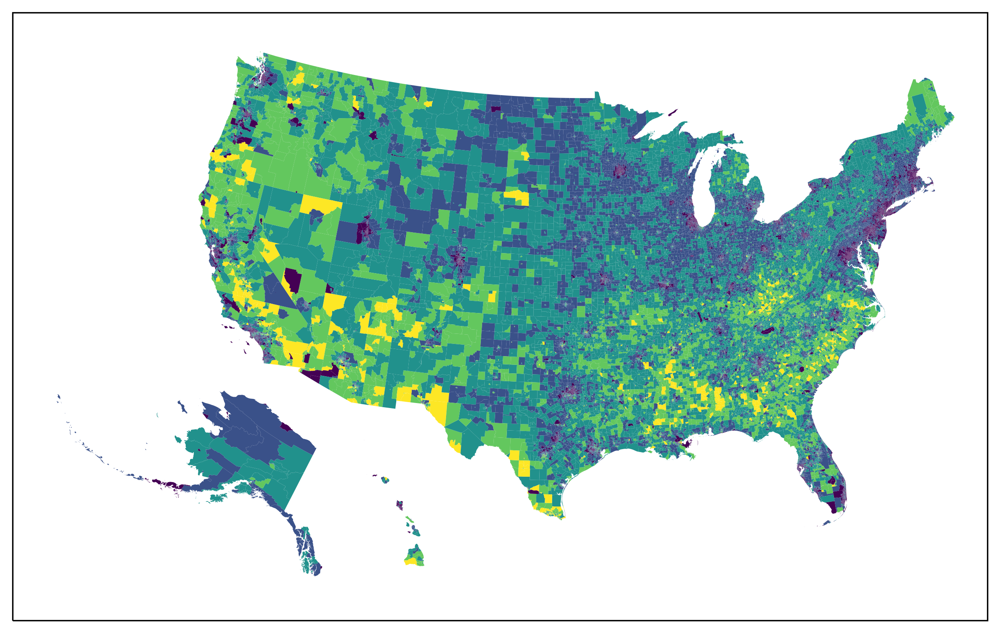

In [41]:
import numpy as np

fig, ax = plt.subplots(
    subplot_kw={'projection': albo}, figsize=(10, 10),dpi=300
)
font = {'family': 'serif',
        'serif': 'Times New Roman',
        'weight': 'normal',
        'size': 12}
plt.rc('font', **font)
ax.set_extent([-129, -73, 20, 50], crs=ccrs.PlateCarree())

from palettable.matplotlib import Viridis_7

cmap = Viridis_7.mpl_colormap

vulnerablity_map.plot(
    column='vul_score_mulpi', # multiplicative or additive
    ax=ax,
    cmap=cmap,
    legend=True,
    scheme='NaturalBreaks',
    legend_kwds={'loc': 'upper left',
                 'title': 'Vulnerability Score',
                 "fmt": "{:.3f}",
                 'title_fontsize': 14, 
                 'fontsize': 11, 
                 'shadow': True
                },               
    missing_kwds={
                "color": "lightgrey",
                "edgecolor": "grey",
                "hatch": "////",
                "label": "Nan"
                },
#     prop={'family': 'Times New Roman', 'size': 16},
    edgecolor=np.array([0., 0., 0., 0.]), #'white',
    linewidth=0.2
)
state_boundary.boundary.plot(ax=ax,edgecolor='white',linewidth=0.5)

ax.axis('on')
ax.set_title('Transportation Energy Vulnerability in the US',fontdict={'weight':'bold','size': 20},pad=20)
plt.tight_layout(pad=4.5)


ax.set_aspect('equal','box')
# fig.tight_layout()

fig.savefig('Figures/Vul_score_mulpi.png', facecolor='w', dpi=500) # multiplicative or additive

UnboundLocalError: local variable 'merged_kwds' referenced before assignment

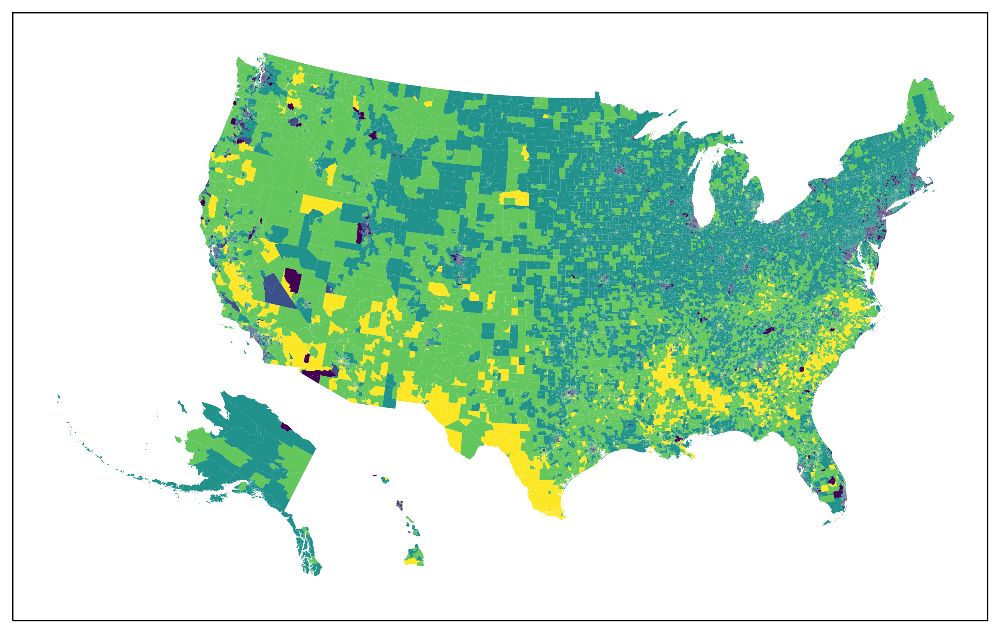

In [42]:
import numpy as np

fig, ax = plt.subplots(
    subplot_kw={'projection': albo}, figsize=(10, 10),dpi=300
)
font = {'family': 'serif',
        'serif': 'Times New Roman',
        'weight': 'normal',
        'size': 12}
plt.rc('font', **font)
ax.set_extent([-129, -73, 20, 50], crs=ccrs.PlateCarree())

from palettable.matplotlib import Viridis_7

cmap = Viridis_7.mpl_colormap

vulnerablity_map.plot(
    column='vul_score_add', # multiplicative or additive
    ax=ax,
    cmap=cmap,
    legend=True,
#     legend_kwds={'label': 'Exposure'},
    scheme='NaturalBreaks',
#     k=7,
    legend_kwds={'loc': 'upper left',
                 'title': 'Vulnerability Score',
                 "fmt": "{:.3f}",
                 'title_fontsize': 14, 
                 'fontsize': 11, 
                 'shadow': True
                },               
    missing_kwds={
                "color": "lightgrey",
                "edgecolor": "grey",
                "hatch": "////",
                "label": "Nan"
                },
#     prop={'family': 'Times New Roman', 'size': 16},
    edgecolor=np.array([0., 0., 0., 0.]), #'white',
    linewidth=0.2
)
state_boundary.boundary.plot(ax=ax,edgecolor='white',linewidth=0.5)

ax.axis('on')
ax.set_title('Transportation Energy Vulnerability in the US',fontdict={'weight':'bold','size': 20},pad=20)
plt.tight_layout(pad=4.5)


ax.set_aspect('equal','box')
# fig.tight_layout()

fig.savefig('Figures/Vul_score_add.png', facecolor='w', dpi=500) # multiplicative or additive

## EV Adoption in IL

In [44]:
vul_IL = pd.read_excel('vul_score CV-EV_base.xlsx',dtype={'CountyFIPs':str})
# vul_IL.info()

In [45]:
IL_map = gpd.read_file('IL_county_shp/IL_BNDY_County_Py.shp',dtype={'CO_FIPS':str})
# IL_map

In [46]:
IL_map_COOK = IL_map[IL_map['COUNTY_NAM']=='COOK']
IL_map_Alexander = IL_map[IL_map['COUNTY_NAM']=='ALEXANDER']

In [47]:
IL_vul_map = pd.merge(vul_IL, IL_map, left_on = 'County', right_on = 'COUNTY_NAM')

In [48]:
IL_vul_map = gpd.GeoDataFrame(IL_vul_map,crs = 4269)

In [49]:
IL_vul_map['2020CV_new'] = IL_vul_map.apply(lambda x: abs(x['2020CV']), axis=1)

In [50]:
IL_vul_map['2020EV_new'] = IL_vul_map.apply(lambda x: abs(x['2020EV']), axis=1)

In [51]:
IL_vul_map['dif_20'] = IL_vul_map.apply(lambda x: x['2020CV_new'] - x['2020EV_new'], axis=1)

In [52]:
print(IL_vul_map['2020CV_new'].max(),IL_vul_map['2020CV_new'].min())

0.5074893846161618 0.0


In [53]:
print(IL_vul_map['2020EV_new'].max(),IL_vul_map['2020EV_new'].min())

0.3608092159333531 0.0


In [54]:
IL_vul_map['dif_50'] = IL_vul_map.apply(lambda x: x['2050CV'] - x['2050EV'], axis=1)  

In [55]:
IL_vul_map['2050CV_new'] = IL_vul_map.apply(lambda x: abs(x['2050CV']), axis=1)

In [56]:
IL_vul_map['2050EV_new'] = IL_vul_map.apply(lambda x: abs(x['2050EV']), axis=1)

In [57]:
print(IL_vul_map['2050CV_new'].max(),IL_vul_map['2050CV_new'].min())

0.7442712535493357 0.0


In [58]:
print(IL_vul_map['2050EV_new'].max(),IL_vul_map['2050EV_new'].min())

0.2645291807629205 0.0


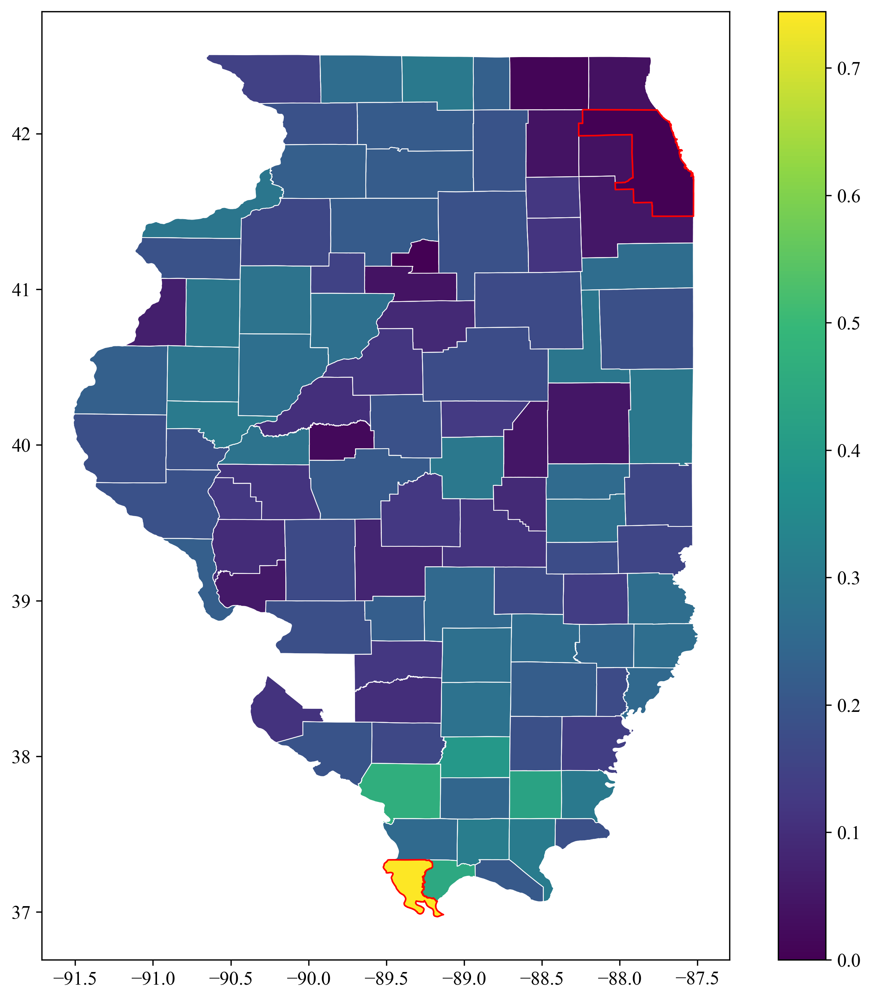

In [59]:
import numpy as np

fig, ax = plt.subplots(figsize=(10, 10),dpi=300)
font = {'family': 'serif',
        'serif': 'Times New Roman',
        'weight': 'normal',
        'size': 12}
plt.rc('font', **font)

from palettable.matplotlib import Viridis_7

cmap = Viridis_7.mpl_colormap

IL_vul_map.plot(
    column='2050CV_new',
    ax=ax,
    cmap=cmap,
    legend=True,
#     legend_kwds={'label': 'Exposure'},
#    scheme='NaturalBreaks',
#     k=7,
#     legend_kwds={'loc': 'lower left',
#                  'title': 'Vulnerability Score',
#                  "fmt": "{:.3f}",
#                  'title_fontsize': 14, 
#                  'fontsize': 11, 
#                  'shadow': True
#                 },
#     prop={'family': 'Times New Roman', 'size': 16},
    edgecolor=np.array([0., 0., 0., 0.]), #'white',
    linewidth=0.2,
    vmin = 0,
    vmax = 0.7442712535493357
)
IL_map.boundary.plot(ax=ax,edgecolor='white',linewidth=0.5)
IL_map_COOK.boundary.plot(ax=ax,edgecolor='red',linewidth=1)
IL_map_Alexander.boundary.plot(ax=ax,edgecolor='red',linewidth=1)


ax.axis('on')
plt.tight_layout(pad=4.5)


ax.set_aspect('equal','box')
# fig.tight_layout()

fig.savefig('Figures/IL_2050CV.png', facecolor='w', dpi=500)

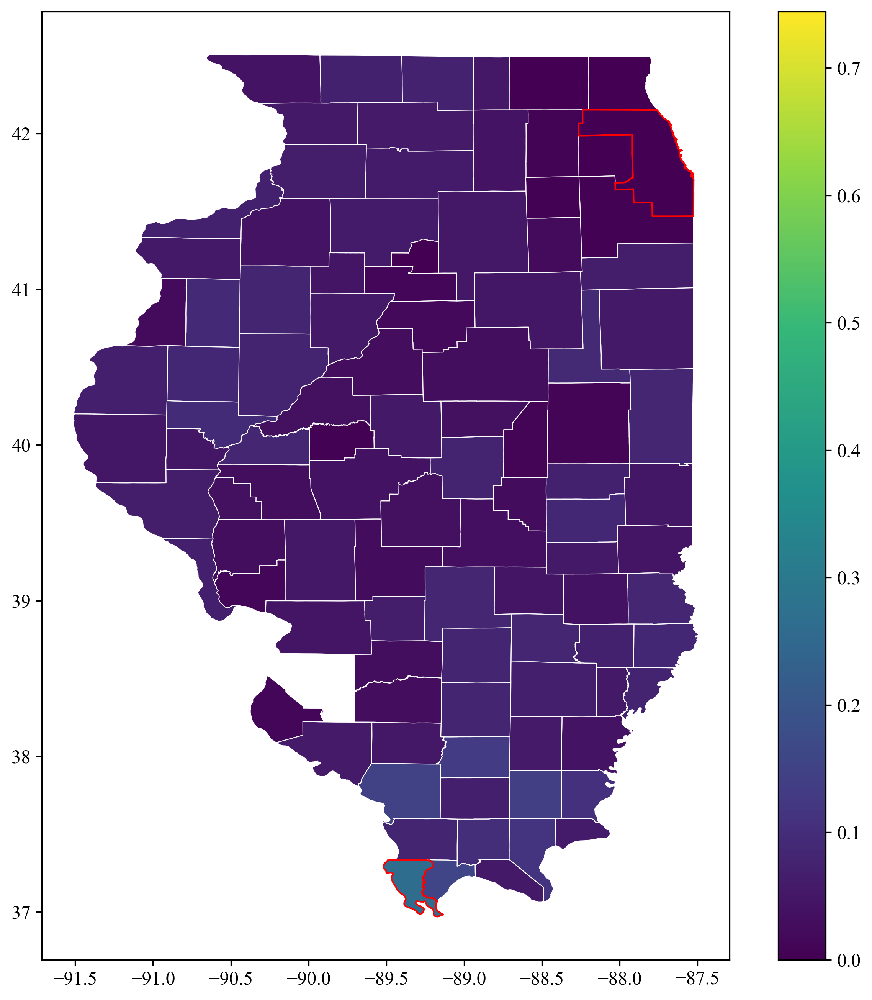

In [60]:
import numpy as np

fig, ax = plt.subplots(figsize=(10, 10),dpi=300)
font = {'family': 'serif',
        'serif': 'Times New Roman',
        'weight': 'normal',
        'size': 12}
plt.rc('font', **font)

from palettable.matplotlib import Viridis_7

cmap = Viridis_7.mpl_colormap

IL_vul_map.plot(
    column='2050EV_new',
    ax=ax,
    cmap=cmap,
    legend=True,
    edgecolor=np.array([0., 0., 0., 0.]), #'white',
    linewidth=0.2,
    vmin = 0,
    vmax = 0.7442712535493357
)
IL_map.boundary.plot(ax=ax,edgecolor='white',linewidth=0.5)
IL_map_COOK.boundary.plot(ax=ax,edgecolor='red',linewidth=1)
IL_map_Alexander.boundary.plot(ax=ax,edgecolor='red',linewidth=1)

ax.axis('on')
plt.tight_layout(pad=4.5)


ax.set_aspect('equal','box')
# fig.tight_layout()

fig.savefig('Figures/IL_2050EV.png', facecolor='w', dpi=500)